In [0]:
!cp -r /content/drive/My\ Drive/covid_data .

In [5]:
cd covid_data

/content/covid_data/covid_data


In [7]:
import os

masks = os.listdir('ann_masks_covid')
imgs = os.listdir('CT_COVID')

masks_ = []
imgs_ = []
for i in range(len(masks)):
	if masks[i].find('%') == -1:
		index = masks[i].rfind('-')
		temp = masks[i][:index] + '.png'
		if temp in imgs:
			imgs_.append(temp)
			masks_.append(masks[i])

	else :
		index = masks[i].rfind('-')
		temp = masks[i][:index]
		index = temp.rfind('%')
		temp = temp[:index+1]+temp[index+3:]
		temp = temp + '.png'
		if temp in imgs:
			imgs_.append(temp)
			masks_.append(masks[i])


print("number of masks_,imgs_ : ",len(masks_),len(imgs_))


number of masks_,imgs_ :  52 52


In [0]:
# for i in range(len(masks_)):
#   print(masks_[i],imgs_[i])

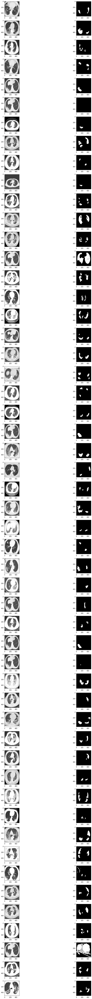

In [9]:
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import numpy as np
fig = plt.figure(figsize=(20,100))
for i in range(len(imgs_)):
  img = cv2.imread('CT_COVID/'+imgs_[i],1)
  mask = cv2.imread('ann_masks_covid/'+masks_[i],0)

  img = np.uint8(img)
  mask = np.uint8(mask)
  
  img = cv2.resize(img,(512,512))
  mask = cv2.resize(mask,(512,512))

  ax = fig.add_subplot(len(imgs_),2,2*i + 1)
  ax.imshow(img)
  ax = fig.add_subplot(len(masks_),2,2*i + 2)
  ax.imshow(mask,cmap='gray')

fig.tight_layout()
plt.show()

In [10]:
print(len(imgs_),len(masks_))

52 52


In [11]:
covid_imgs = []
covid_masks = []
for i in range(len(imgs_)):
    img = 'CT_COVID/' + imgs_[i]
    #print(img,end=" ")
    img = cv2.imread(img,1)
    img = cv2.resize(img,(128,128))
    covid_imgs.append(img)
    #print(img.shape)

    mask = 'ann_masks_covid/' + masks_[i]
    #print(mask,end=" ")
    mask = cv2.imread(mask,0)
    mask = cv2.resize(mask,(128,128))
    mask = np.expand_dims(mask,-1)
    covid_masks.append(mask)
    #print(mask.shape)
print(len(covid_imgs),len(covid_masks))

52 52


In [12]:
non_covid = os.listdir('CT_NonCOVID')
non_covid_imgs = []
non_covid_masks = []
for i in non_covid:
    i = 'CT_NonCOVID/' + i
    img = cv2.imread(i,1)
    img = cv2.resize(img,(128,128))
    #print(img.shape)
    #print(type(img))
    non_covid_imgs.append(img)
import sklearn
non_covid_imgs = sklearn.utils.shuffle(non_covid_imgs)
non_covid_imgs = non_covid_imgs[:76]
mask =  np.zeros((128,128))
mask = np.expand_dims(mask,-1) 
for i in range(76):
    non_covid_masks.append(mask)
    #print(mask.shape)
print(len(non_covid_imgs),len(non_covid_masks))

76 76


In [13]:
x_data = []
x_data.extend(covid_imgs)
x_data.extend(non_covid_imgs)

y_data = []
y_data.extend(covid_masks)
y_data.extend(non_covid_masks)
print(len(x_data),len(y_data))
x_data,y_data = sklearn.utils.shuffle(x_data,y_data)

128 128


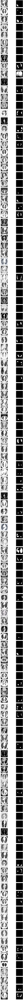

In [14]:
fig = plt.figure(figsize=(20,500))
for i in range(len(x_data)):
    img = x_data[i]
    mask = y_data[i]
    mask = cv2.resize(mask,(128,128))
    img = np.uint8(img)
    mask = np.uint8(mask)
    
    ax = fig.add_subplot(len(x_data),2,2*i + 1)
    ax.imshow(img)
    ax = fig.add_subplot(len(y_data),2,2*i + 2)
    ax.imshow(mask,cmap='gray')
    
fig.tight_layout()
plt.show()

In [15]:
print(len(x_data),len(y_data))
x_train = x_data[:96]
y_train = y_data[:96]

x_val = x_data[96:116]
y_val = y_data[96:116]

x_test = x_data[116:]
y_test = y_data[116:]

print(len(x_train),len(y_train))
print(len(x_test),len(y_test))
print(len(x_val),len(y_val))


128 128
96 96
12 12
20 20


In [16]:
x_train = np.asarray(x_train)
y_train = np.asarray(y_train)

x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

x_val = np.asarray(x_val)
y_val = np.asarray(y_val)

print(x_train.shape,y_train.shape)
print(x_test.shape,y_test.shape)
print(x_val.shape,y_val.shape)

(96, 128, 128, 3) (96, 128, 128, 1)
(12, 128, 128, 3) (12, 128, 128, 1)
(20, 128, 128, 3) (20, 128, 128, 1)


In [17]:
import tensorflow as tf


IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3


#Build the model
inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)
 
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)
 
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)
 
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path 
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)
 
u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)
 
u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)
 
u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)
 
outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)
 
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 128, 128, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 16) 448         lambda[0][0]                     
__________________________________________________________________________________________________
dropout (Dropout)               (None, 128, 128, 16) 0           conv2d[0][0]                     
______________________________________________________________________________________________

In [22]:
model.fit(x_train,y_train,batch_size=8,epochs=10,verbose=1,validation_data=(x_val,y_val))

Epoch 1/10
12/12 [==============================] - 0s 22ms/step - loss: nan - accuracy: 0.9679 - val_loss: nan - val_accuracy: 0.9840
Epoch 2/10
12/12 [==============================] - 0s 23ms/step - loss: nan - accuracy: 0.9679 - val_loss: nan - val_accuracy: 0.9840
Epoch 3/10
12/12 [==============================] - 0s 22ms/step - loss: nan - accuracy: 0.9679 - val_loss: nan - val_accuracy: 0.9840
Epoch 4/10
12/12 [==============================] - 0s 22ms/step - loss: nan - accuracy: 0.9679 - val_loss: nan - val_accuracy: 0.9840
Epoch 5/10
12/12 [==============================] - 0s 22ms/step - loss: nan - accuracy: 0.9679 - val_loss: nan - val_accuracy: 0.9840
Epoch 6/10
12/12 [==============================] - 0s 23ms/step - loss: nan - accuracy: 0.9679 - val_loss: nan - val_accuracy: 0.9840
Epoch 7/10
12/12 [==============================] - 0s 23ms/step - loss: nan - accuracy: 0.9679 - val_loss: nan - val_accuracy: 0.9840
Epoch 8/10
12/12 [==============================] - 0s 

In [23]:
print(model.evaluate(x_test,y_test))


1/1 [==============================] - 0s 1ms/step - loss: nan - accuracy: 0.9833
[nan, 0.9833018183708191]


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [24]:
result = model.predict(x_test)
print(type(result))


<class 'numpy.ndarray'>


(128, 128, 3) (128, 128) (128, 128)
(128, 128, 3) (128, 128) (128, 128)
(128, 128, 3) (128, 128) (128, 128)
(128, 128, 3) (128, 128) (128, 128)
(128, 128, 3) (128, 128) (128, 128)
(128, 128, 3) (128, 128) (128, 128)
(128, 128, 3) (128, 128) (128, 128)
(128, 128, 3) (128, 128) (128, 128)


/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:85: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


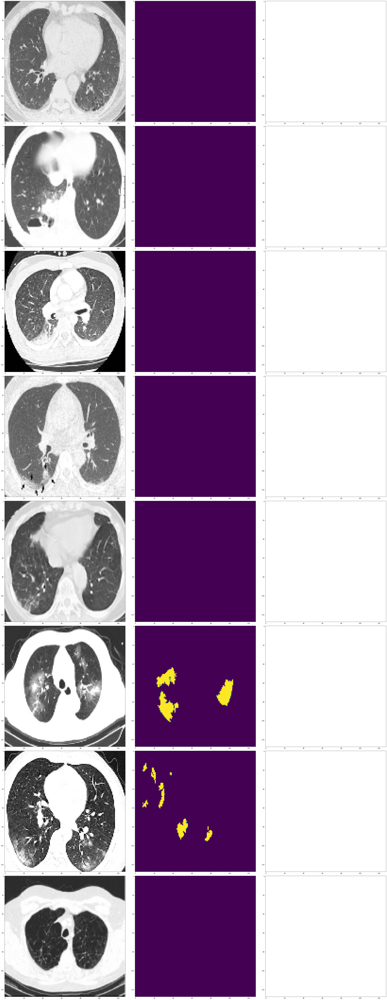

In [34]:
fig = plt.figure(figsize=(40,100))
for i in range(8):
    img = x_test[i,:,:,:]
    mask = y_test[i,:,:,:]
    mask = cv2.resize(mask,(128,128))
    res = result[i,:,:,:]
    res = cv2.resize(res,(128,128))
    print(img.shape,mask.shape,res.shape)
    ax = fig.add_subplot(8,3,3*i +1)
    ax.imshow(img)
    ax = fig.add_subplot(8,3,3*i +2)
    ax.imshow(mask)
    ax = fig.add_subplot(8,3,3*i +3)
    ax.imshow(res)
    # img = np.uint8(img)
    # mask = np.uint8(mask)
    
    # ax = fig.add_subplot(len(x_data),2,2*i + 1)
    # ax.imshow(img)
    # ax = fig.add_subplot(len(y_data),2,2*i + 2)
    # ax.imshow(mask,cmap='gray')
    
fig.tight_layout()
plt.show()

In [31]:
print(len(covid_imgs))
temp = covid_imgs[:10]
temp = np.asarray(temp)
print(temp.shape)

52
(10, 128, 128, 3)


In [0]:
temp_result = model.predict(temp)
fig = plt.figure(figsize=(20,100))
for i in range(8):
    img = temp[i,:,:,:]
    res = temp_result[i,:,:,:]
    res = cv2.resize(res,(128,128))
    print(img.shape,mask.shape,res.shape)
    ax = fig.add_subplot(8,3,3*i +1)
    ax.imshow(img)
    ax = fig.add_subplot(8,3,3*i +2)
    ax.imshow(mask)
    ax = fig.add_subplot(8,3,3*i +2)
    ax.imshow(res)